In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import time
import imageio
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Reshape
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Conv2DTranspose
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import array_to_img, img_to_array, load_img
from numpy.random import randn
from numpy.random import randint
import tensorflow as tf

In [2]:
n_images = 10000
batch_size = 32
latent_dim = 100
n_epoch = 50
img_shape = (128, 128, 3)

In [6]:
data_dir = '../input/celeba-dataset/img_align_celeba/img_align_celeba/' 
images = os.listdir(data_dir)
images = images[:n_images]

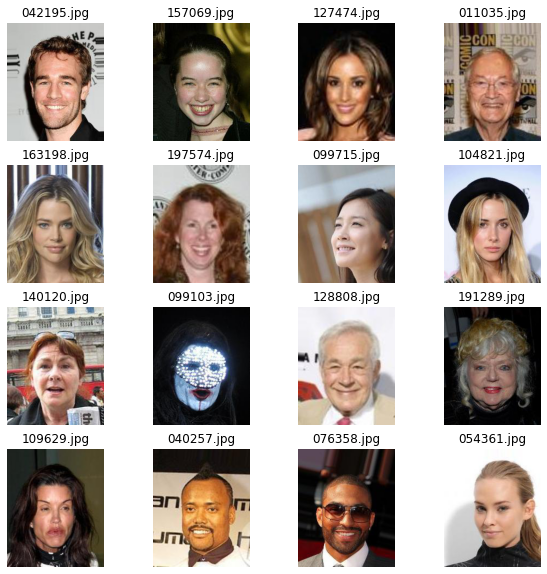

In [7]:
plt.figure(figsize=(10,10))
for i, name in enumerate(images[16:32]):
    plt.subplot(4, 4, i + 1)
    img = plt.imread(data_dir + '/' + name)
    plt.imshow(img)
    plt.title(name)
    plt.axis('off')

In [8]:
def data(data_path) :
    X = []
    for filename in data_path :
        img = img_to_array(load_img(data_dir + "/" + filename, target_size = (128,128)))
        X.append(img)
    X = np.array(X).astype('float32')
    X = X / 255
    return X

df = data(images)

(-0.5, 177.5, 217.5, -0.5)

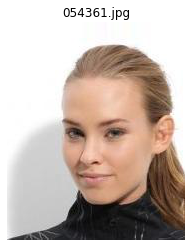

In [9]:
img = plt.imread(data_dir + '/' + name)
plt.imshow(img)
plt.title(name)
plt.axis('off')

In [10]:
df.shape

(10000, 128, 128, 3)

Originally, ReLU was recommend for use in the generator model and LeakyReLU was recommended for use in the discriminator model, although more recently, the LeakyReLU is recommended in both models.

In [11]:
def define_discriminator(in_shape=(128,128,3)):
    model = Sequential()
    model.add(Conv2D(256, (4,4), padding='same', input_shape=in_shape))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.4))
    # downsample to 64x64
    model.add(Conv2D(256, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.4))
    # downsample to 32x32
    model.add(Conv2D(256, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.4))
    # downsample to 16x16
    model.add(Conv2D(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.4))
    # downsample to 8x8
    model.add(Conv2D(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.4))
    # classifier
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation='sigmoid'))
    # compile model
    opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    return model


In [12]:
def define_generator(latent_dim):
    model = Sequential()
    # foundation for 8x8 feature maps
    n_nodes = 128 * 8 * 8
    model.add(Dense(n_nodes,activation='relu', input_dim=latent_dim))
    model.add(Reshape((8, 8, 128)))
    # upsample to 16x16
    model.add(Conv2DTranspose(256, (4,4), strides=(2,2),activation='relu', padding='same'))
    model.add(Dropout(0.4))
    # upsample to 32x32
    model.add(Conv2DTranspose(256, (4,4), strides=(2,2),activation='relu', padding='same'))
    model.add(Dropout(0.4))
    # upsample to 64x64
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2),activation='relu', padding='same'))
    model.add(Dropout(0.4))
    # upsample to 128x128
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2),activation='relu', padding='same'))
    model.add(Dropout(0.4))
    # output layer 128x128x3
    model.add(Conv2D(3, (5,5), activation='tanh', padding='same'))
    return model

In [13]:
discriminator = define_discriminator()
generator = define_generator(latent_dim)

In [14]:
discriminator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 128, 128, 256)     12544     
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 128, 128, 256)     0         
_________________________________________________________________
dropout (Dropout)            (None, 128, 128, 256)     0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 256)       1048832   
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 64, 64, 256)       0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 64, 64, 256)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 256)       1

In [15]:
generator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 8192)              827392    
_________________________________________________________________
reshape (Reshape)            (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 16, 16, 256)       524544    
_________________________________________________________________
dropout_6 (Dropout)          (None, 16, 16, 256)       0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 32, 32, 256)       1048832   
_________________________________________________________________
dropout_7 (Dropout)          (None, 32, 32, 256)       0         
_________________________________________________________________
conv2d_transpose_2 (Conv2DTr (None, 64, 64, 128)      

In [16]:
from tensorflow.keras import layers

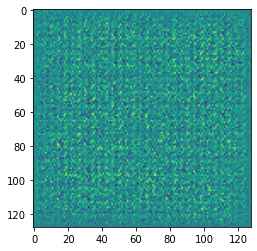

In [18]:
generator = define_generator(latent_dim)

x_input = np.random.normal(0,1,[batch_size, latent_dim])
generated_image = generator(x_input, training=False)

plt.imshow(generated_image[0, :, :, 0])

In [20]:
def plot_generated_image(data,epoch, n=5):
    plt.figure(figsize=(10,10))
    for i in range(n * n):
        plt.subplot(n, n, i + 1)
        plt.imshow(data[i])
        plt.axis('off')
    plt.savefig('Generated_image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()    
def plot_real_image(data, epoch, n=5):
    plt.figure(figsize=(10,10))
    for i in range(n * n):
        plt.subplot(n, n, i + 1)
        plt.imshow(data[i])
        plt.axis('off')
    plt.savefig('Real_image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()     

In [21]:
discriminator = define_discriminator()
generator = define_generator(latent_dim)
discriminator.trainable = False

gan_input = tf.keras.Input(shape=(latent_dim,))
gan_output = discriminator(generator(gan_input))
gan = tf.keras.models.Model(gan_input, gan_output)

gan_optimizer = tf.keras.optimizers.RMSprop(lr=0.0004, clipvalue=1.0, decay=1e-8)
gan.compile(optimizer=gan_optimizer, loss='binary_crossentropy')

In [22]:
d_loss_list = []
gan_loss_list=[]
def train(generator_model, discriminator_model, gan_model, df, latent_dim=100, n_epochs=50, batch_size=32):
    start = time.time()
    beginning = 0
    for i in range(1,n_epochs+1):
        for j in range(df.shape[0]//batch_size):
            # fake samples
            x_input = np.random.normal(0,1,[batch_size, latent_dim])
            generated_images =generator_model.predict(x_input)

            stop=beginning+batch_size
            #real samples
            real_images = df[beginning: stop]
            
            combined_images = np.concatenate([generated_images, real_images])

            labels = np.concatenate([np.ones((batch_size, 1)),np.zeros((batch_size, 1))])
            # Add random noise to the labels
            labels += 0.05 * np.random.random(labels.shape)
            discriminator.trainable=True
            
            d_loss = discriminator.train_on_batch(combined_images, labels)
            d_loss_list.append(d_loss)


            X_gan = np.random.normal(0,1,[batch_size, latent_dim])
            misleading_targets = np.zeros((batch_size, 1))
            discriminator.trainable=False

            gan_loss = gan_model.train_on_batch(X_gan, misleading_targets)
            gan_loss_list.append(gan_loss)
            beginning += batch_size
            if beginning > len(df) - batch_size:
                  beginning = 0
        if i == 1 or i==5 or i==7:
            # Print metrics
            print('discriminator loss at step {} :{}'.format(i, d_loss))
            print('adversarial loss at step {} :{}'.format (i, gan_loss))
            print ('Total time for training {} epochs is {} sec'.format(i, (time.time()-start)))            
            plot_generated_image(generated_images, i)
        if i % 10 == 0:
            # Save model weights
            gan.save_weights('gan_2.h5')
            filename = 'generator_model_20000.h5'
            generator_model.save(filename)
            # Print metrics
            print('discriminator loss at step {} :{}'.format(i, d_loss))
            print('adversarial loss at step {} :{}'.format (i, gan_loss))
            print ('Total time for training {} epochs is {} sec'.format(i, (time.time()-start)))            
            plot_generated_image(generated_images, i)
            plot_real_image(real_images, i)    


In [23]:
gan.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
sequential_4 (Sequential)    (None, 128, 128, 3)       3197059   
_________________________________________________________________
sequential_3 (Sequential)    (None, 1)                 2905089   
Total params: 6,102,148
Trainable params: 3,197,059
Non-trainable params: 2,905,089
_________________________________________________________________


discriminator loss at step 1 :[0.7268706560134888, 0.0]
adversarial loss at step 1 :0.7298499345779419
Total time for training 1 epochs is 216.17758774757385 sec


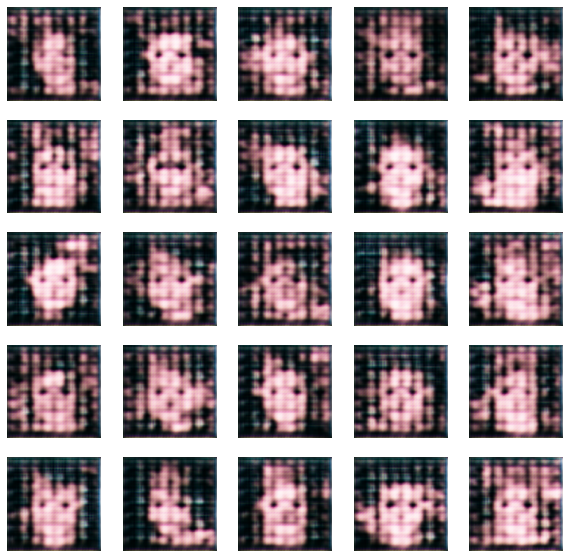

discriminator loss at step 5 :[0.6624019145965576, 0.0]
adversarial loss at step 5 :0.9145969152450562
Total time for training 5 epochs is 1066.8550102710724 sec


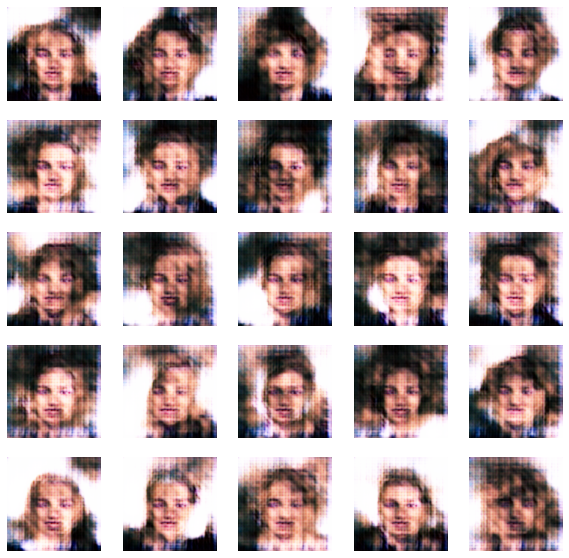

discriminator loss at step 7 :[0.6988521814346313, 0.0]
adversarial loss at step 7 :1.45686936378479
Total time for training 7 epochs is 1491.3512980937958 sec


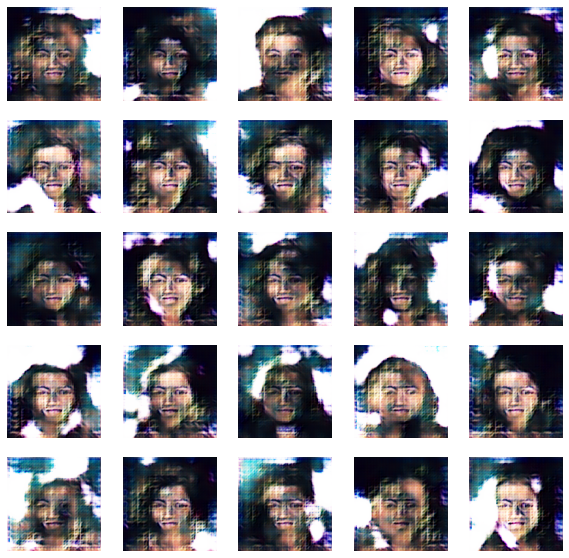

discriminator loss at step 10 :[0.47190770506858826, 0.0]
adversarial loss at step 10 :1.8393172025680542
Total time for training 10 epochs is 2127.757140159607 sec


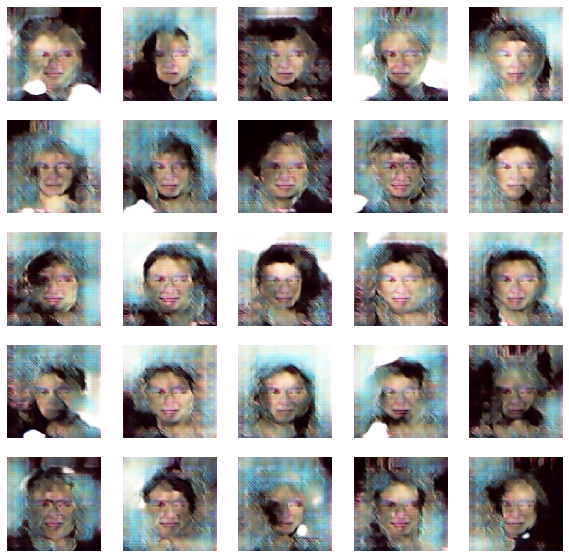

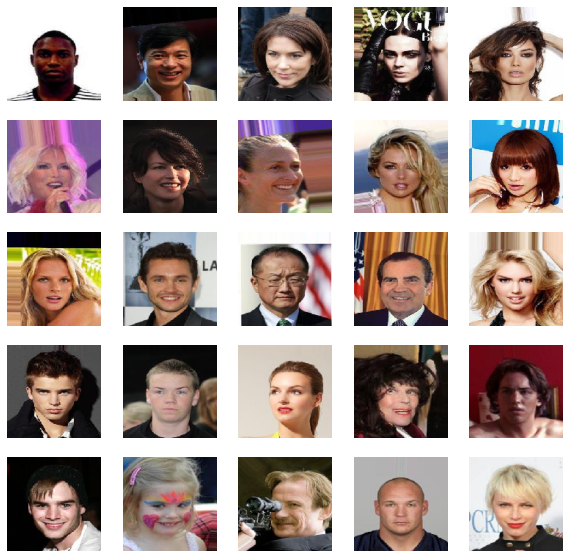

discriminator loss at step 20 :[0.41609257459640503, 0.0]
adversarial loss at step 20 :2.645850896835327
Total time for training 20 epochs is 4246.162771463394 sec


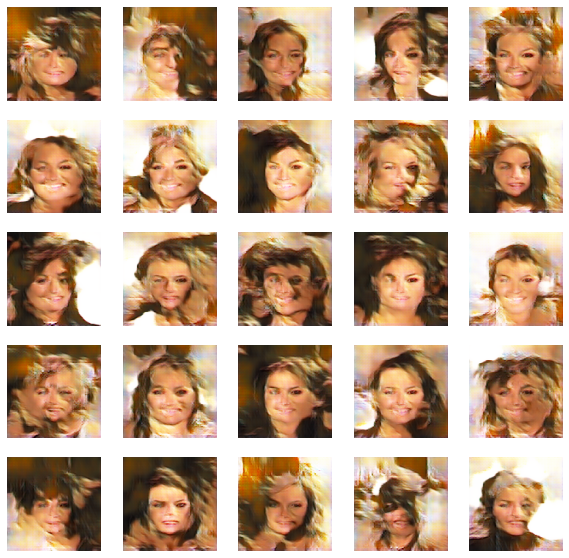

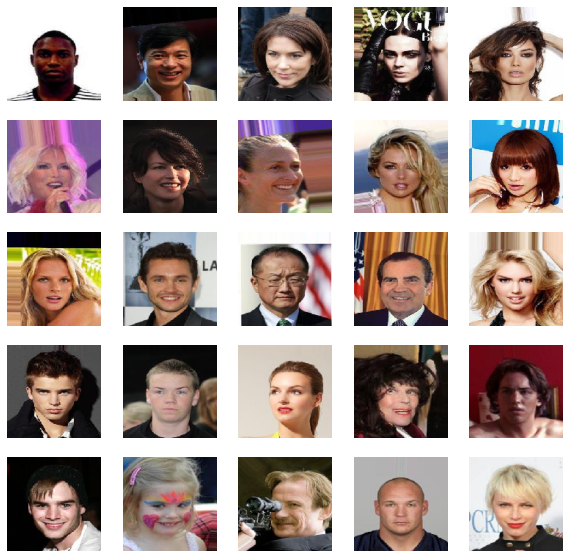

discriminator loss at step 30 :[0.4401018023490906, 0.0]
adversarial loss at step 30 :2.5654730796813965
Total time for training 30 epochs is 6365.553902864456 sec


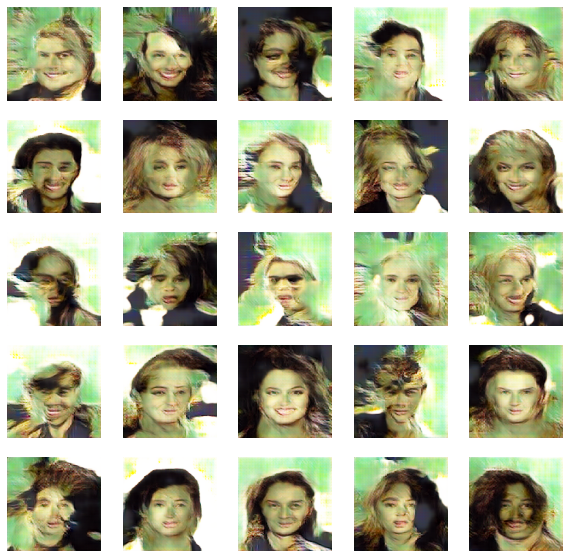

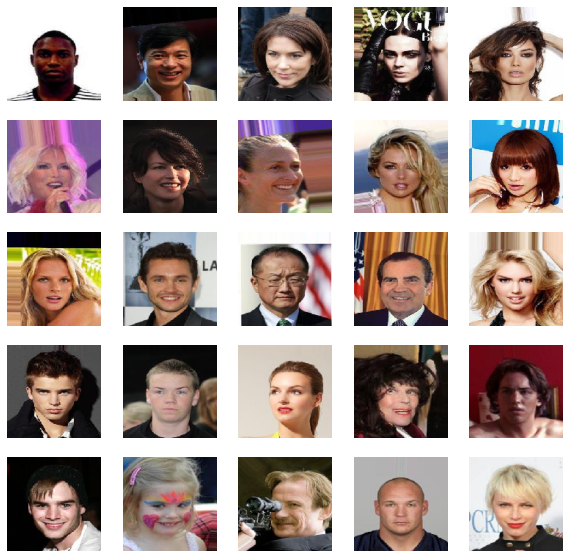

discriminator loss at step 40 :[0.2931438386440277, 0.0]
adversarial loss at step 40 :3.011748790740967
Total time for training 40 epochs is 8484.328901290894 sec


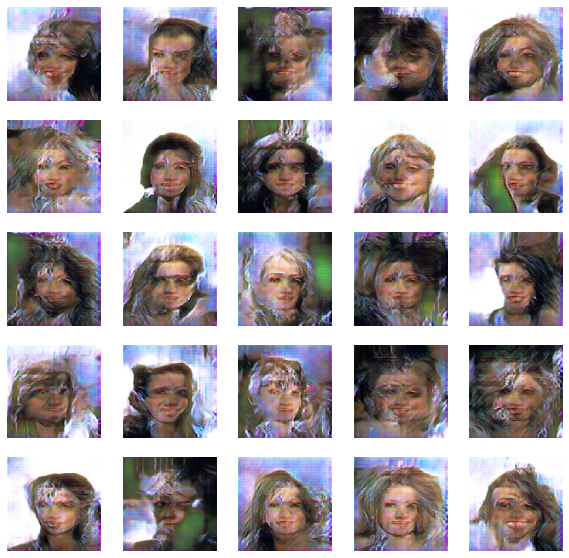

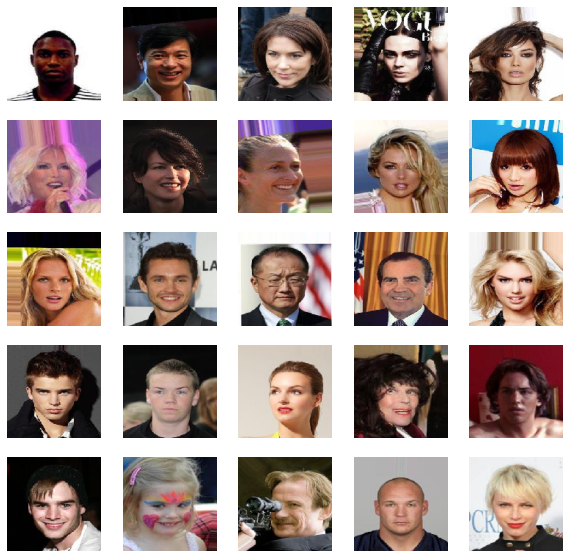

discriminator loss at step 50 :[0.15475261211395264, 0.0]
adversarial loss at step 50 :5.525864601135254
Total time for training 50 epochs is 10600.802056074142 sec


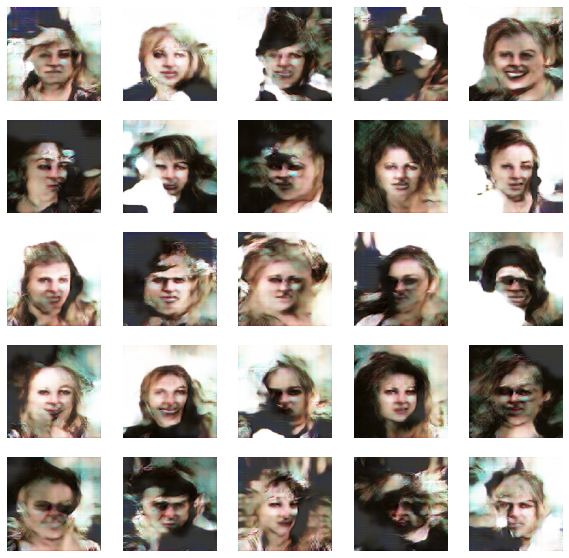

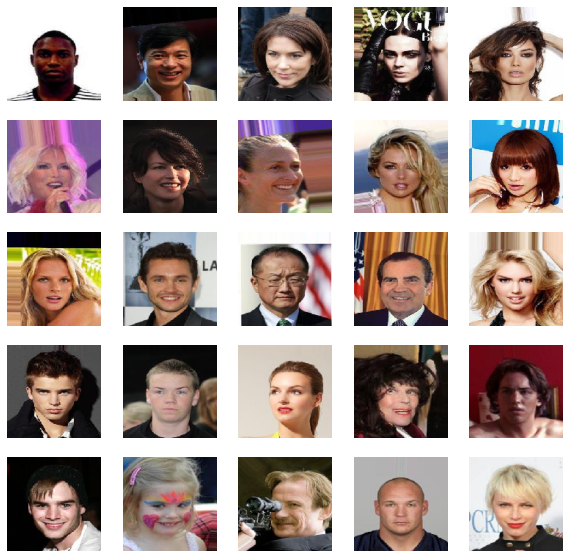

In [24]:
# train model
train(generator, discriminator, gan, df, latent_dim, n_epoch, batch_size)

In [25]:
np.save('d_loss_list.npy',d_loss_list )

In [26]:
np.save('gan_loss_list.npy',gan_loss_list )

In [3]:
d_losses=np.load('d_loss_list.npy')
gan_losses=np.load('gan_loss_list.npy')

In [4]:
d_loss_list2=[]
for n in range(len(d_losses)):
    d_loss_list2.append(d_losses[n][0])

In [16]:
gan_loss_list3=[]
for n in range(len(gan_losses)):
    if gan_losses[n]>0 and gan_losses[n]<1:
        gan_loss_list3.append(gan_losses[n])

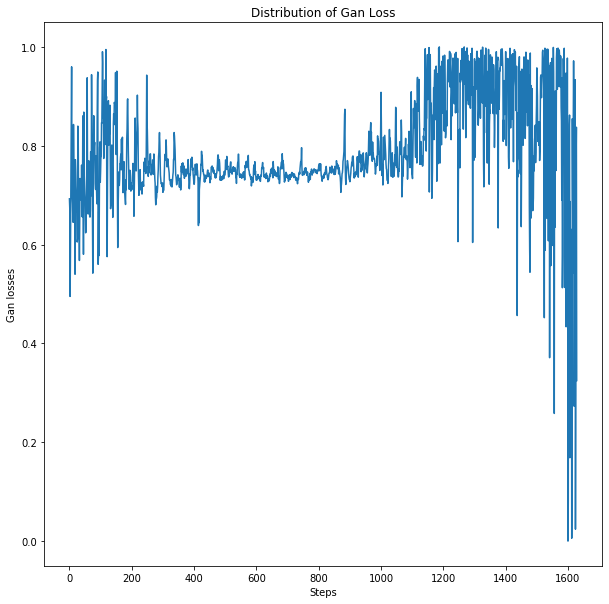

In [17]:
plt.figure(figsize=(10,10))
plt.plot(gan_loss_list3)
plt.xlabel('Steps')
plt.ylabel('Gan losses')
plt.title('Distribution of Gan Loss')
plt.show()

In [12]:
d_loss_list3=[]
for n in range(len(d_loss_list2)):
    if d_loss_list2[n]>0 and d_loss_list2[n]<1:
        d_loss_list3.append(d_loss_list2[n])


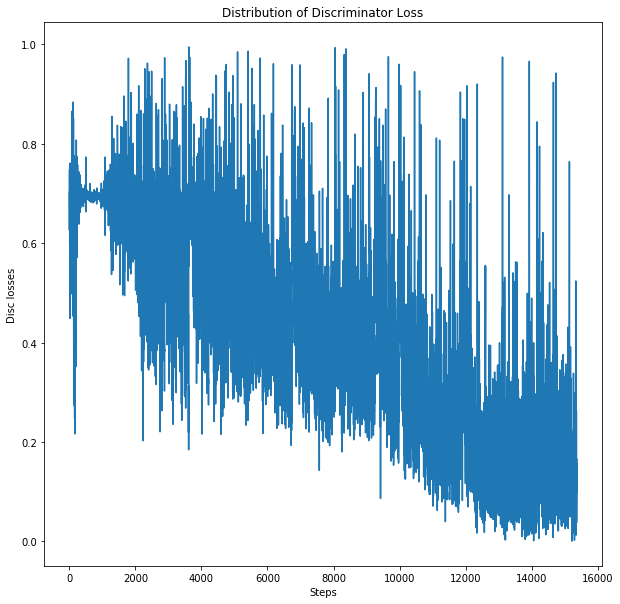

In [15]:
plt.figure(figsize=(10,10))
plt.plot(d_loss_list3)
plt.xlabel('Steps')
plt.ylabel('Disc losses')
plt.title('Distribution of Discriminator Loss')
plt.show()

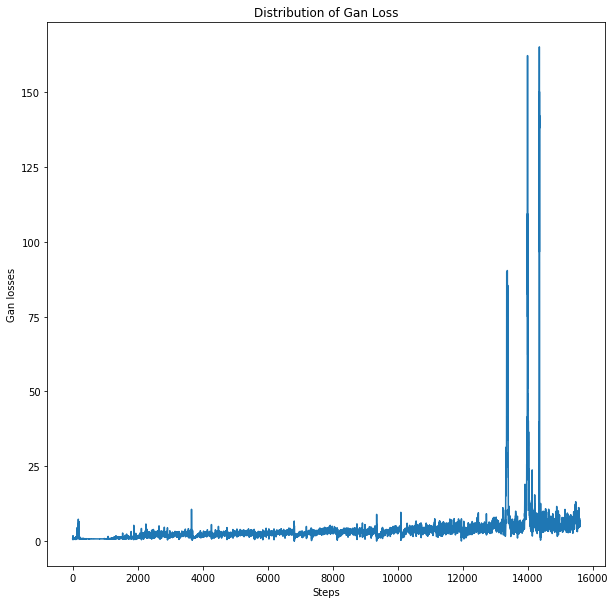

In [7]:
plt.figure(figsize=(10,10))
plt.plot(gan_losses)
plt.xlabel('Steps')
plt.ylabel('Gan losses')
plt.title('Distribution of Gan Loss')
plt.show()

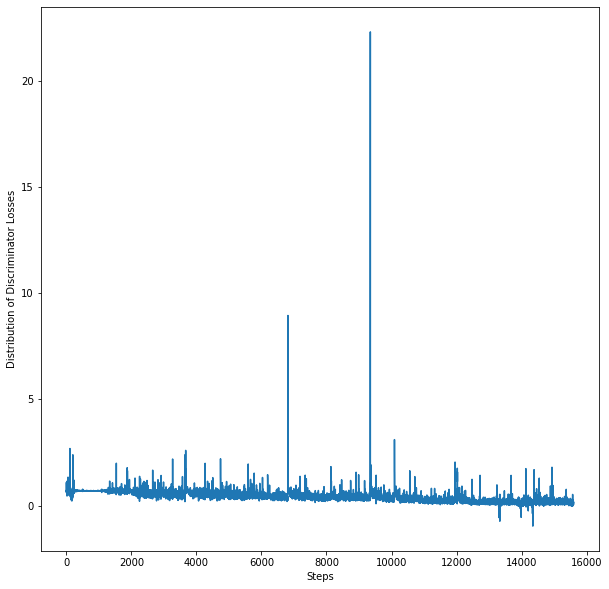

In [12]:
plt.figure(figsize=(10,10))
plt.plot(d_loss_list2)
plt.xlabel('Steps')
plt.ylabel('Distribution of Discriminator Losses')
plt.show()

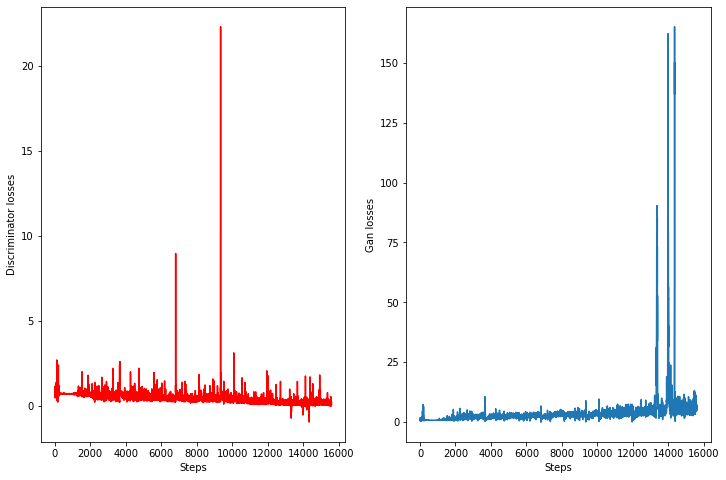

In [14]:
plt.figure(1, figsize=(12, 8))
plt.subplot(121)
plt.plot(d_loss_list2, color='red')
plt.xlabel('Steps')
plt.ylabel('Discriminator losses')
plt.subplot(122)
plt.plot(gan_losses)
plt.xlabel('Steps')
plt.ylabel('Gan losses')
plt.show()

In [34]:
from tensorflow.keras.preprocessing import image

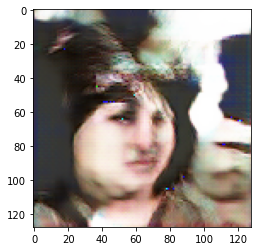

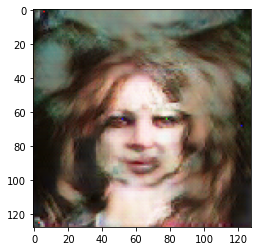

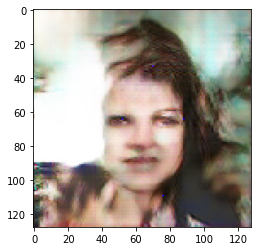

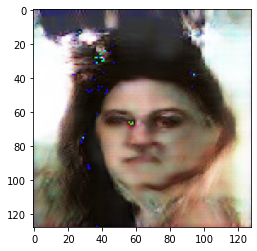

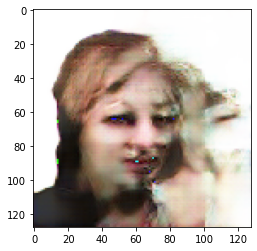

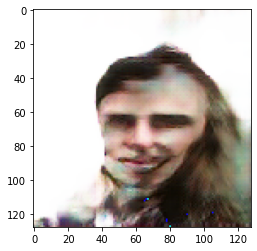

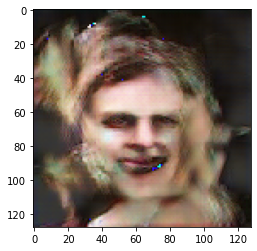

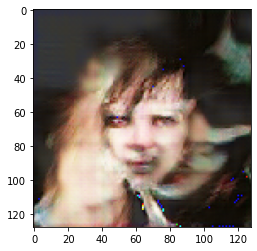

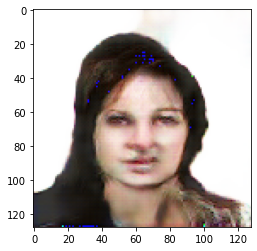

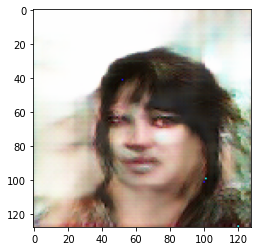

In [35]:
# Sample random points in the latent space
random_latent_vectors = np.random.normal(size=(10, latent_dim))

generated_images = generator.predict(random_latent_vectors)

for i in range(generated_images.shape[0]):
    img = image.array_to_img(generated_images[i] * 255., scale=False)
    plt.figure()
    plt.imshow(img)
    
plt.show()

In [15]:
from numpy import linspace
from numpy import asarray
from tensorflow.keras.models import load_model

In [20]:
def latent_points(latent_dim, batch_size):
    x_input=np.random.normal(0,1,size=[batch_size,latent_dim])
    return x_input

In [19]:
def plot_generated(examples, n):
    # plot images
    plt.figure(figsize=(20, 10))
    for i in range(n):
        plt.subplot(1, n, 1 + i)
        plt.axis('off')
        plt.imshow(examples[i, :, :])
    plt.savefig('Interpoleted_image2.png')    
    plt.show()

In [18]:
def interpolate_points(p1, p2, n_steps=10):
    ratios = linspace(0, 1, num=n_steps)
    vectors = list()
    for ratio in ratios:
        v = (1.0 - ratio) * p1 + ratio * p2
        vectors.append(v)
    return asarray(vectors)

In [16]:
model = load_model('generator_model.h5')

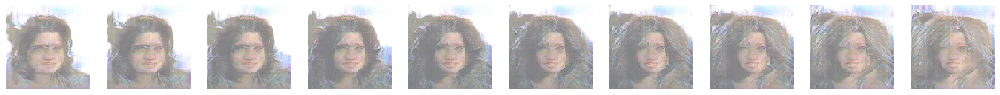

In [21]:
pts=np.random.normal(0,1,size=[batch_size,latent_dim])
interpolated = interpolate_points(pts[0], pts[1])
X = model.predict(interpolated)
X = (X + 1) / 2.0
plot_generated(X, len(interpolated))

In [48]:
from numpy import vstack

In [22]:
def plot_generated_2(examples, n):
    plt.figure(figsize=(50, 50))
    for i in range(n*n):
        plt.subplot(n, n, 1 + i)
        plt.axis('off')
        plt.imshow(examples[i, :, :])
    plt.savefig('Interpoleted_image_10.png') 
    plt.show()

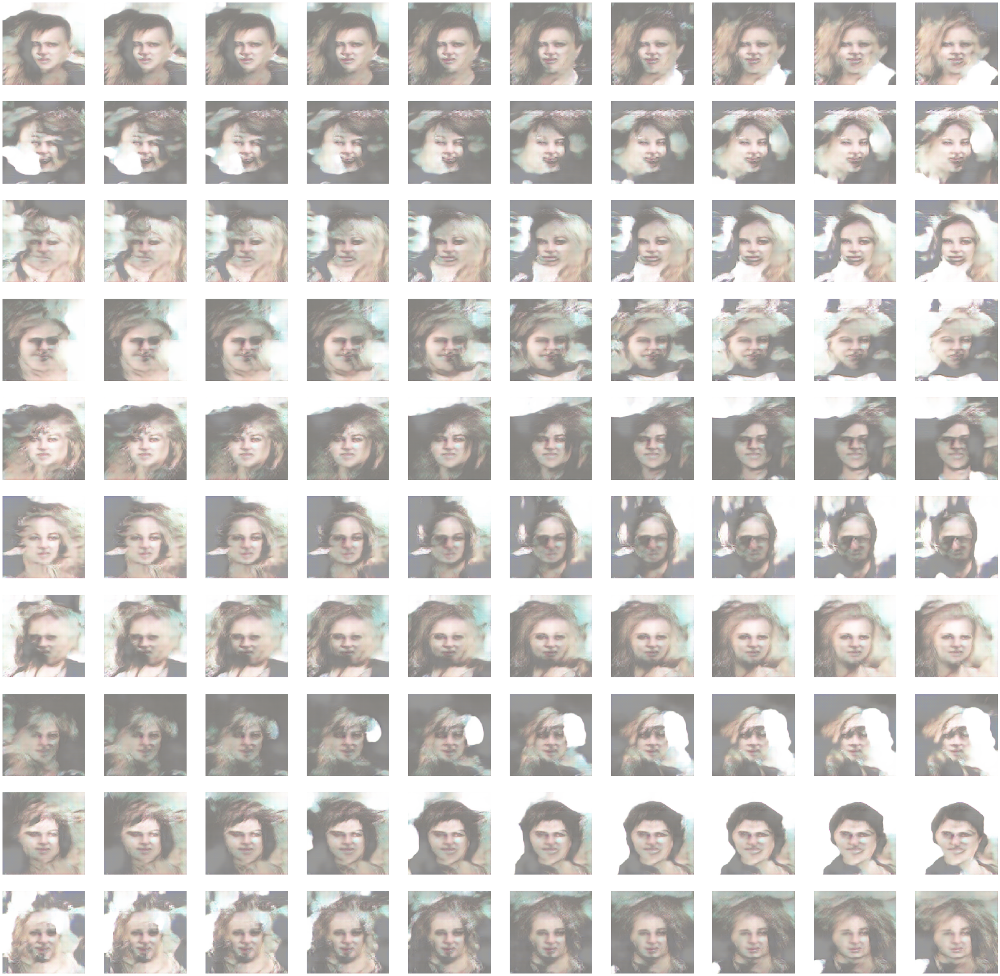

In [50]:
# generate points in latent space
n = 20
pts = latent_points(latent_dim, n)
# interpolate pairs
results = None
for i in range(0, n, 2):
    # interpolate points in latent space
    interpolated = interpolate_points(pts[i], pts[i+1])
    # generate images
    X = model.predict(interpolated)
    # scale from [-1,1] to [0,1]
    X = (X + 1) / 2.0
    if results is None:
        results = X
    else:
        results = vstack((results, X))
# plot the result
plot_generated_2(results, 10)